In [ ]:
%matplotlib inline

import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
import cv2
import os
import glob
from tqdm import tqdm
from sklearn.model_selection import train_test_split
import pickle

from tensorflow import keras
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Dropout
from keras.layers import Flatten
from keras.layers.convolutional import Conv2D
from keras.layers.convolutional import MaxPooling2D
from keras.utils import np_utils
from keras.callbacks import ModelCheckpoint
from keras.applications.vgg16 import VGG16
from keras.preprocessing import image
from keras.applications.vgg16 import preprocess_input
!pip install tensorflow-addons
import tensorflow_addons as tfa
from tqdm.keras import TqdmCallback

from __future__ import print_function, division

import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import torch.backends.cudnn as cudnn
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import time
import copy
import torch.nn.functional as F
import torchvision.transforms as transforms



     |████████████████████████████████| 1.1 MB 19.5 MB/s 


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **Vehicle license plate detection**
### **MIE1517 project report**

Apr. 2, 2022

###Group member:



> Zijian Wei 1002276823



> Xiangzi Chen 1003818915



> Shubo Wan 1007826907



> Hongzhou Zhang 1005928294




## Colab Link

Include a link to your colab file here

Colab Link: https://drive.google.com/file/d/1BfDlBx4h_9RUafL2b-2HhT50hK-bu53l/view?usp=sharing



# **Abstract**

This project is aiming to build a set of machine learning models to detect and recognize vehicle license plates in images. The first part of this project implements a convolution neural net (CNN) architecture VGG16 using Keras to localize the license plate in an image. The CNN model has been trained using images with labels of bounding boxes around the license plates. The trained model has shown a reasonable level of accuracy in localizing the plates in the testing image set.

The second part of the project is to recognize and output the letters and digits in a plate in order. The plate images generated in the first part are preprocessed using some character segmentation techniques to obtain an individual image of each character. Then the characters are recognized using a CNN classification model. A final test of the end to end pipeline was conducted on 42 new images taken by the group members. On 88% of the 42 images, the model can predict a proper bounding box around the plate. And the model correctly recognized 76.6% of all the characters on the plates.​

A flow chart of the end-to-end pipeline is shown below:
<img src='https://drive.google.com/uc?id=1pMef_G6ZdJoDhluvdajlUo8nVGko2zKM'>

# **Introduction**

License plate recognition is one of the essential components of modern intelligent transportation systems and has been widely used. Based on digital image processing, pattern recognition, and other technologies, vehicle images are analyzed to obtain a unique license plate number for each vehicle, which can help maintain traffic safety, prevent traffic congestion, and realize automatic traffic management. This project proposed a license plate recognition method to detect and recognize vehicle license plates in images. It is mainly divided into two parts, one is license plate localization, which will be addressed in part 1, and the other is character recognition, which will be explored in part 2. The conclusions and future improvement will be discussed in part 3.

**Data sources**:

*   Part 1: 

Larxel. (2020, June 1). Car License Plate Detection. Kaggle. Retrieved March 18, 2022, from https://www.kaggle.com/datasets/andrewmvd/car-plate-detection

Roboflow. (2021, May 2). License Plates Object Detection Dataset - original license plates. Roboflow. Retrieved March 18, 2022, from https://public.roboflow.com/object-detection/license-plates-us-eu/3 

*   Part 2: 

Jaiswal, A. (2021, October 7). Standard OCR dataset. Kaggle. Retrieved April 8, 2022, from https://www.kaggle.com/datasets/preatcher/standard-ocr-dataset 
https://www.kaggle.com/datasets/preatcher/standard-ocr-dataset

**References**:


* Emilieyip. (2020, September 17). Vehicle License Plate Detection: CNN. Kaggle. Retrieved March 18, 2022, from https://www.kaggle.com/code/emilieyip/vehicle-license-plate-detection-cnn 
* Zadiyounes. (2019, April 21). Text_detection. Kaggle. Retrieved March 18, 2022, from <br> https://www.kaggle.com/code/zadiyounes/text-detection/notebook
* Nguyen. (2020, May 2) Detect and Recognize Vehicle’s License Plate with Machine Learning and Python — Part 2: Plate character segmentation with OpenCV Retrieved March 18, 2022, from https://medium.com/@quangnhatnguyenle/detect-and-recognize-vehicles-license-plate-with-machine-learning-and-python-part-2-plate-de644de9849f

# **Part 1 - Vehicle plate detection**

## 1.1 Load data and preprocess

This project will use two datasets, one is from Kaggle and the other one is from Roboflow. The two datasets contain 783 car images in total, and also the corresponding information of the locations of bounding boxes around the license plates. 

Firstly, the images and annotation information were resized to 224*224 pixels to avoid the problems with bigger resolution images.

### 1.1.1 Resize images

#### 1.1.1.1 Kaggle data set

In [ ]:
# Get image file path and sort the files
image_path = '/content/drive/MyDrive/MIE1517_Project_2022/data_kaggle/images' 

image_name_list_1 = []
for car_image in os.listdir(image_path):
    full_path = os.path.join(image_path, car_image)
    image_name_list_1.append(full_path)

# Sort the image files by the image index in ascending order to ensure they can match the xml files containing the annotations of the bounding boxes
image_name_list_1 = sorted(image_name_list_1, key = lambda x: int(x.split('/')[-1].split('.')[0][4:]))

# Read image files and resize images
resized_images_list_1 = []
for full_path in image_name_list_1:
    image = cv2.imread(full_path)
    resize_image = cv2.resize(image, (224, 224))
    resized_images_list_1.append(np.array(resize_image))

print('Successfuly loaded {} resized images'.format(len(resized_images_list_1)))

Successfuly loaded 433 resized images


Visualize first fifteen images of the dataset:

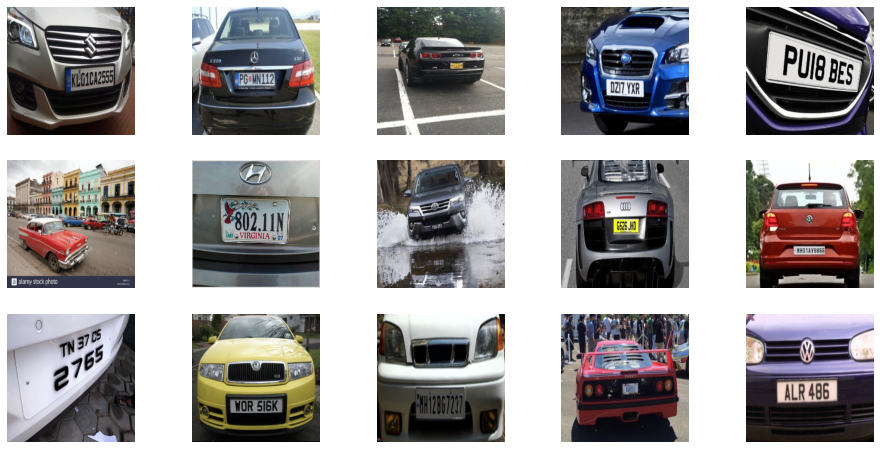

In [ ]:
plt.figure(figsize=(16,8))
k = 0
for images in resized_images_list_1:
    plt.subplot(3, 5, k+1)
    plt.axis('off')
    plt.imshow(cv2.cvtColor(images, cv2.COLOR_BGR2RGB))

    k += 1
    if k > 14:
        break

#### 1.1.1.2 Roboflow data set

In [ ]:
# Get image file path
data_path = ['/content/drive/MyDrive/MIE1517_Project_2022/data_roboflow/test',
            '/content/drive/MyDrive/MIE1517_Project_2022/data_roboflow/train',
             '/content/drive/MyDrive/MIE1517_Project_2022/data_roboflow/valid']

image_name_list_2 = [glob.glob(path+'/images/*.jpg') for path in data_path]
image_name_list_2 = [item for sublist in image_name_list_2 for item in sublist]

# Read image files and resize images
resized_images_list_2 = []
for full_path in image_name_list_2:
    image = cv2.imread(full_path)
    resize_image = cv2.resize(image, (224, 224))
    resized_images_list_2.append(np.array(resize_image))

print('Successfuly loaded {} resized images'.format(len(resized_images_list_2)))

Successfuly loaded 350 resized images


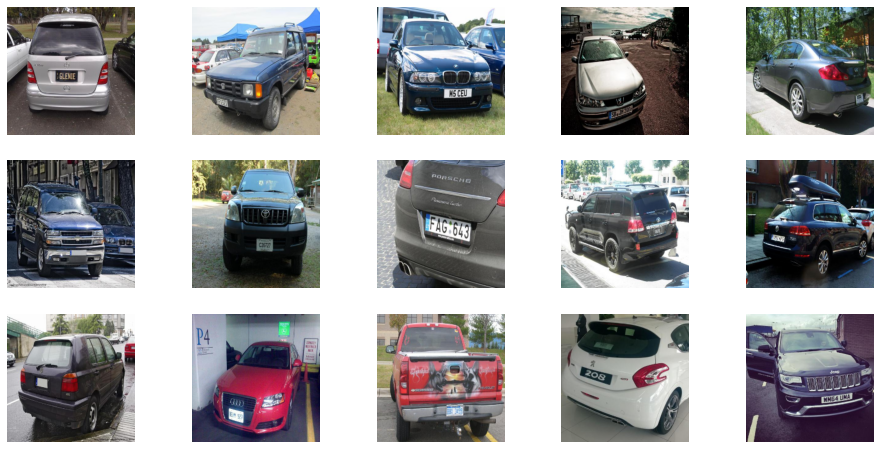

In [ ]:
plt.figure(figsize=(16,8))
k = 0
for images in resized_images_list_2:
    plt.subplot(3, 5, k+1)
    plt.axis('off')
    plt.imshow(cv2.cvtColor(images, cv2.COLOR_BGR2RGB))

    k += 1
    if k > 14:
        break

### 1.1.2 Resize annotation files

#### 1.1.2.1 Kaggle data set

In [ ]:
# Get annotation file path and sort the files
annotation_path = '/content/drive/MyDrive/MIE1517_Project_2022/data_kaggle/annotations'

annotation_list_1 = []
for annotation in os.listdir(annotation_path):
    full_path = os.path.join(annotation_path, annotation)
    annotation_list_1.append(full_path)

# Sort the annotation files by the image index in ascending order to ensure they can match the image files
annotation_list_1 = sorted(annotation_list_1, key = lambda x: int(x.split('/')[-1].split('.')[0][4:]))   

# Read annotation files and resize
from lxml import etree

resized_annotation_list_1 = []
for f in annotation_list_1:

  tree = etree.parse(f)
  for dim in tree.xpath("size"):
    width = int(dim.xpath("width")[0].text)
    height = int(dim.xpath("height")[0].text)

  for dim in tree.xpath("object/bndbox"):
    xmin = int(dim.xpath("xmin")[0].text) / (width / 224)
    ymin = int(dim.xpath("ymin")[0].text) / (height / 224)
    xmax = int(dim.xpath("xmax")[0].text) / (width / 224)
    ymax = int(dim.xpath("ymax")[0].text) / (height / 224)

  resized_annotation_list_1.append([int(ymin), int(xmin), int(ymax), int(xmax)])

print('Successfuly loaded {} resized annotation files'.format(len(resized_annotation_list_1)))

Successfuly loaded 433 resized annotation files


Visualize first fifteen images of the dataset with bounding box for plate:

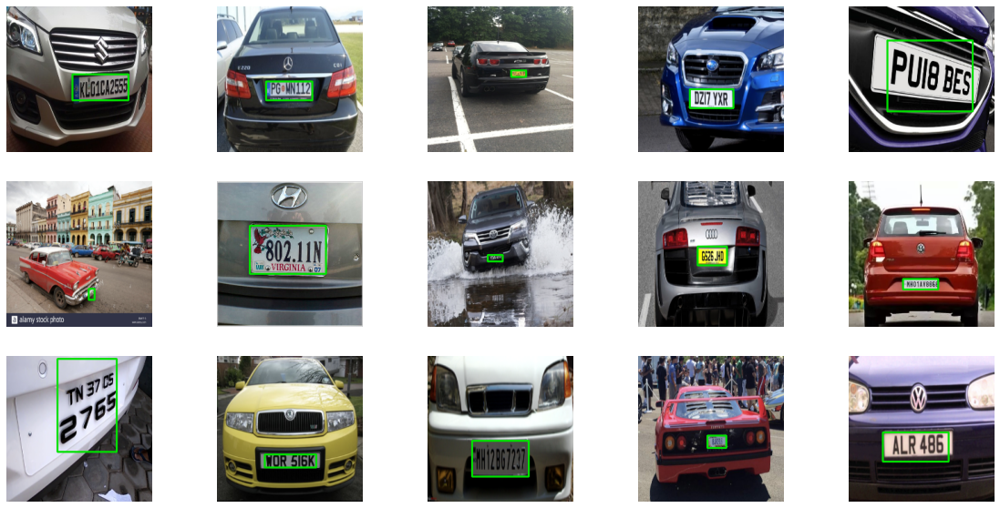

In [ ]:
plt.figure(figsize=(20,10))

k = 0
while k < 15:
  plt.subplot(3, 5, k+1)
  plt.axis('off')
  
  # Draw bounding box from resized annotation files on the resized images using the OpenCV library
  image_copy = resized_images_list_1[k].copy()
  xmin = resized_annotation_list_1[k][1]
  ymin = resized_annotation_list_1[k][0]
  xmax = resized_annotation_list_1[k][3]
  ymax = resized_annotation_list_1[k][2]

  cv2.rectangle(image_copy, (int(xmin), int(ymin)), (int(xmax), int(ymax)), color = (0, 225, 0), thickness = 2)

  # Display the images with bounding box for plate
  plt.imshow(cv2.cvtColor(image_copy, cv2.COLOR_BGR2RGB))

  k += 1

#### 1.1.2.2 Roboflow data set

In [ ]:
annotation_list_2 = [path[0:-3].replace("images", "labels")+'txt' for path in image_name_list_2]

resized_annotation_list_2 = []
for f in annotation_list_2:
  label_txt = np.loadtxt(f)
  if len(label_txt.shape) == 1:
    xc, yc, width, height = label_txt[1], label_txt[2], label_txt[3], label_txt[4]
  else:
    ind = np.array([x[3]*x[4] for x in label_txt]).argmax()
    xc, yc, width, height = label_txt[ind][1], label_txt[ind][2], label_txt[ind][3], label_txt[ind][4]

  xmin = (xc-width/2)*224
  ymin = (yc-height/2)*224
  xmax = (xc+width/2)*224
  ymax = (yc+height/2)*224

  resized_annotation_list_2.append([int(ymin), int(xmin), int(ymax), int(xmax)])

print('Successfuly loaded {} resized annotation files'.format(len(resized_annotation_list_2)))

Successfuly loaded 350 resized annotation files


Visualize first fifteen images of the dataset with bounding box for plate:

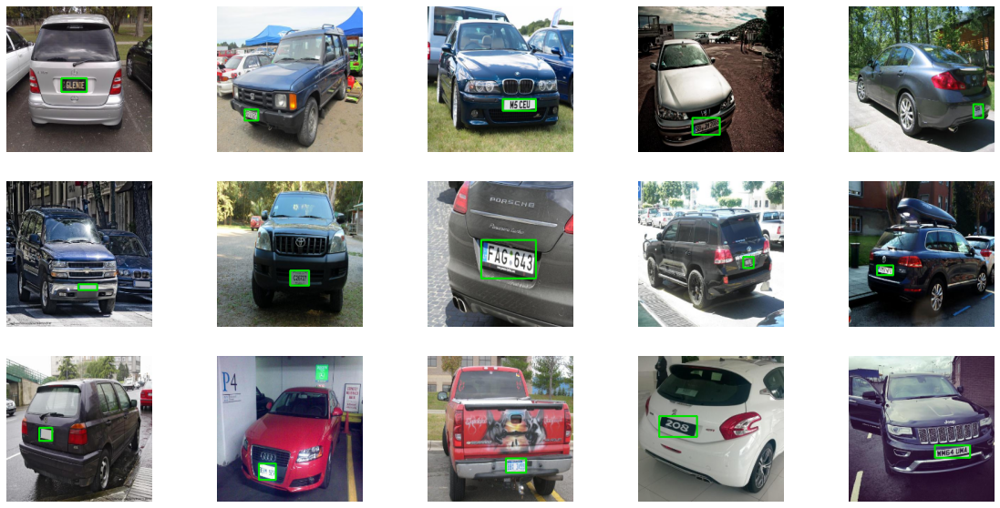

In [ ]:
plt.figure(figsize=(20,10))

k = 0
while k < 15:
  plt.subplot(3, 5, k+1)
  plt.axis('off')
  
  # Draw bounding box from resized annotation files on the resized images using the OpenCV library
  image_copy = resized_images_list_2[k].copy()

  xmin = resized_annotation_list_2[k][1]
  ymin = resized_annotation_list_2[k][0]
  xmax = resized_annotation_list_2[k][3]
  ymax = resized_annotation_list_2[k][2]
  
  cv2.rectangle(image_copy, (int(xmin), int(ymin)), (int(xmax), int(ymax)), color = (0, 225, 0), thickness = 2)
  
  # Display the images with bounding box for plate
  plt.imshow(cv2.cvtColor(image_copy, cv2.COLOR_BGR2RGB))

  k += 1

### 1.1.3 Normalization and split

Also, each image needs to be normalized with the same acquired values to make it suitable for the model and ensure that each input parameter (pixel, in this case) has a similar data distribution, which could help the network to learn faster since gradients act uniformly for each channel.

Normalize both image and annotation data:

In [ ]:
# Combine the Kaggle and Roboflow dataset
resized_images_list = resized_images_list_1 + resized_images_list_2
resized_annotation_list = resized_annotation_list_1 + resized_annotation_list_2

# Normalization

# Make all pixel color ranges from 0 to 1
normalized_X = np.array(resized_images_list) / 255 # Pixel values are often unsigned integers in the range between 0 and 255
normalized_y = np.array(resized_annotation_list) / 224 # Image size

from sklearn.model_selection import train_test_split

# Split data into training set, validation set and testing set
X_train, X_test, y_train, y_test = train_test_split(normalized_X, normalized_y, test_size = 0.3, random_state = 3)
X_val, X_test, y_val, y_test = train_test_split(X_test, y_test, test_size = 0.5, random_state = 1)

print(X_train.shape, y_train.shape)
print(X_val.shape, y_val.shape)
print(X_test.shape, y_test.shape)

(548, 224, 224, 3) (548, 4)
(117, 224, 224, 3) (117, 4)
(118, 224, 224, 3) (118, 4)


## 1.2 Train CNN models for plate detection

In this model, we use VGG16 as our main network architecture. VGG16 is a type of CNN and object detection and classification algorithm that is capable of predicting the location of boundary boxes with high accuracy. We will use the pre-trained weights of ImageNet as an initialization other than using a random initialization.



### 1.2.1 Set up CNN model

The architecture for VGG16 is shown below. There are 13 convolutional layers, 5 Max Pooling layers, and 3 Dense layers, for a total of 21 layers, but it has only 16 weighted layers. The input tensor size of VGG16 is 224,244 with 3 RGB channels. The convolutional and max-pool layers are arranged consistently throughout the architecture. The Conv-1 layer has 64 filters, Conv-2 has 128 filters, Conv-3 has 256 filters, and Conv-4 and Conv 5 have 512 filters. Three fully connected (FC) layers follow the stack of convolutional layers, and the last layer is a soft-max layer.

We have changed the dense layers in the default VGG16 model in Keras. We replaced the 3 fully-connected layers at the top of the network with our own three dense layers with different dimensions to predict the car license plate's positions. The last one is a sigmoid activation layer now.

The model architecture is shown below.
<img src = 'https://drive.google.com/uc?id=1qQX9qZDb_9LwmzDrNulT-GUU0lUl3z0S'>



For the loss function, we chose to use the GIoU loss function that maximizes the overlap area of the ground truth box and the predicted bounding box. The GIoU loss function will decrease the chance of not capturing the true bounding box. It increases the size of the predicted bounding box to increase the overlap area with the target box by moving the predicted box slowly towards the target box. The loss function will be

$L_{GIoU} = 1 - IoU + \frac{|C-B \cup B^{gt}|}{|C|}$

where C is the smallest box that covers the prediction box and the ground truth box, which acts as a penalty term to bring the prediction box closer to the target ground truth box; IoU is the IoU loss which only works when the predicted box overlaps with the ground truth box, which will not lead to any moving for non-overlapping cases, and the formula for IoU is

$IoU = \frac{B \cap B^{gt}}{B \cup B^{gt}}$

With the moving gradients strategy in GIoU loss, it can achieve better precision than MSE loss and IoU loss.

In [ ]:
def create_model(learning_rate):
  # Creat CNN model
  cnn = Sequential()
  cnn.add(VGG16(weights="imagenet", include_top=False, input_shape=(224, 224, 3)))
  cnn.add(Flatten())
  cnn.add(Dense(128, activation="relu"))
  cnn.add(Dense(128, activation="relu"))
  cnn.add(Dense(64, activation="relu"))

  # There should be 4 outputs: ymin, xmin, ymax, xmax of the bounding box
  cnn.add(Dense(4, activation="sigmoid"))
  # cnn.layers[-6].trainable = False

  # Train model
  opt = keras.optimizers.Adam(learning_rate=learning_rate)
  cnn.compile(loss = tfa.losses.GIoULoss(), optimizer=opt)
  return cnn

def train_cnn(epochs, batch_size, learning_rate, checkpoint_filepath):
  model = create_model(learning_rate)
  checkpoint = ModelCheckpoint(checkpoint_filepath, monitor='val_loss',verbose=0,
                               save_weights_only=True,save_best_only=True,mode='min')
  train = model.fit(X_train, y_train, validation_data=(X_val, y_val),
                    epochs = epochs, batch_size = batch_size, callbacks=[checkpoint,TqdmCallback(verbose=0)], verbose=0)

  # Plot accuracy and loss curves
  fig = plt.figure(figsize=(6, 4))

  # ax = fig.add_subplot(1, 2, 2)
  loss = train.history['loss']
  val_loss = train.history['val_loss']
  epochs = range(len(loss))
  plt.plot(epochs, loss, 'b', label='Training set loss')
  plt.plot(epochs, val_loss, 'r', label='Validation set loss')
  plt.title('Loss')
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

  return model, train

### 1.2.2 Hyperparemeter tuning

The effects of batch size and learning rate will be investigated.

0epoch [00:00, ?epoch/s]

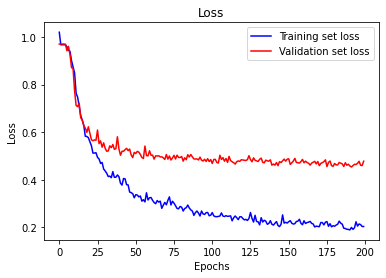

best val_loss = 0.453


In [ ]:
bs = 32
lr = 0.00005
cf = "/content/drive/MyDrive/MIE1517_Project_2022/temp/best_model_bs{}_lr{}.ckpt".format(bs, lr)
cnn1, train1 = train_cnn(epochs=200, batch_size=bs, learning_rate=lr, checkpoint_filepath=cf)

model = create_model(lr)
model.load_weights(cf)
loss = model.evaluate(X_val, y_val, verbose=0)
print('best val_loss = {:.3f}'.format(loss))

0epoch [00:00, ?epoch/s]

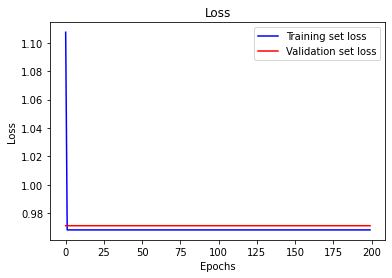

best val_loss = 0.971


In [ ]:
bs = 32
lr = 0.0002
cf = "/content/drive/MyDrive/MIE1517_Project_2022/temp/best_model_bs{}_lr{}.ckpt".format(bs, lr)
cnn1, train1 = train_cnn(epochs=200, batch_size=bs, learning_rate=lr, checkpoint_filepath=cf)

model = create_model(lr)
model.load_weights(cf)
loss = model.evaluate(X_val, y_val, verbose=0)
print('best val_loss = {:.3f}'.format(loss))

0epoch [00:00, ?epoch/s]

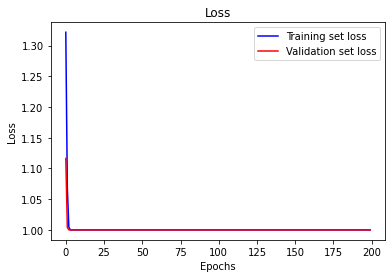

best val_loss = 1.000


In [ ]:
bs = 32
lr = 0.00001
cf = "/content/drive/MyDrive/MIE1517_Project_2022/temp/best_model_bs{}_lr{}.ckpt".format(bs, lr)
cnn1, train1 = train_cnn(epochs=200, batch_size=bs, learning_rate=lr, checkpoint_filepath=cf)

model = create_model(lr)
model.load_weights(cf)
loss = model.evaluate(X_val, y_val, verbose=0)
print('best val_loss = {:.3f}'.format(loss))

0epoch [00:00, ?epoch/s]

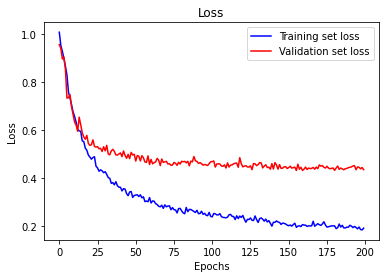

best val_loss = 0.431


In [ ]:
bs = 16
lr = 0.00005
cf = "/content/drive/MyDrive/MIE1517_Project_2022/temp/best_model_bs{}_lr{}.ckpt".format(bs, lr)
cnn1, train1 = train_cnn(epochs=200, batch_size=bs, learning_rate=lr, checkpoint_filepath=cf)

model = create_model(lr)
model.load_weights(cf)
loss = model.evaluate(X_val, y_val, verbose=0)
print('best val_loss = {:.3f}'.format(loss))

0epoch [00:00, ?epoch/s]

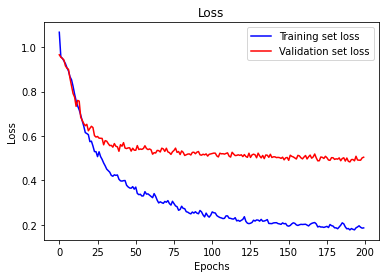

best val_loss = 0.483


In [ ]:
bs = 64
lr = 0.00005
cf = "/content/drive/MyDrive/MIE1517_Project_2022/temp/best_model_bs{}_lr{}.ckpt".format(bs, lr)
cnn1, train1 = train_cnn(epochs=200, batch_size=bs, learning_rate=lr, checkpoint_filepath=cf)

model = create_model(lr)
model.load_weights(cf)
loss = model.evaluate(X_val, y_val, verbose=0)
print('best val_loss = {:.3f}'.format(loss))

We can see that learning rate of 0.0002 and 0.00001 resulted in problematic model training. The three batch sizes did not cause much difference, batch size 16 had slightly higher validation loss. The two hyperparameters are chosen as: `batch_size = 16` and `learning_rate = 0.00005`.

### 1.2.3 Predictions on the test set

In [ ]:
# load the best model
bs = 16
lr = 0.00005
cf = "/content/drive/MyDrive/MIE1517_Project_2022/temp/best_model_bs{}_lr{}.ckpt".format(bs, lr)

best_model = create_model(lr)
best_model.load_weights(cf)

loss = best_model.evaluate(X_test, y_test, verbose=0)
print('test loss = {:.3f}'.format(loss))

test loss = 0.495


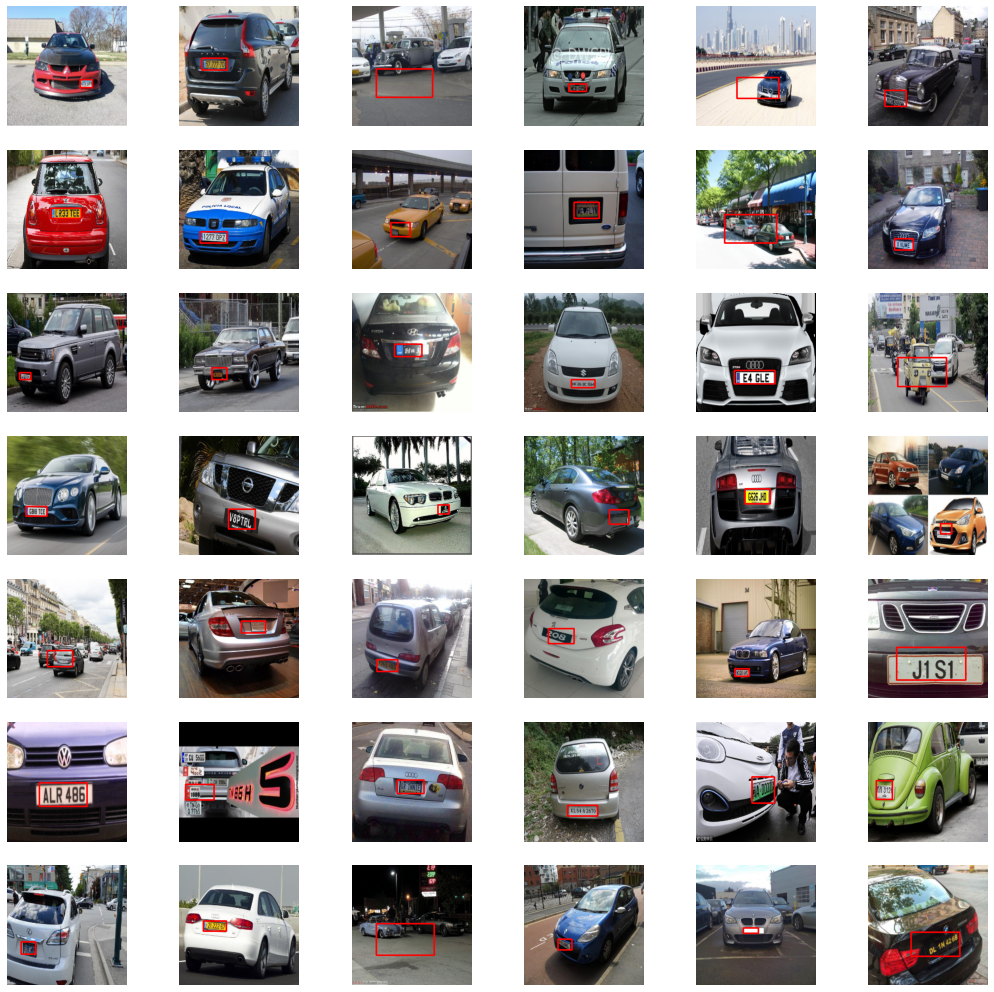

In [ ]:
# Make prediction using the best cnn model
y_cnn = best_model.predict(X_test)

# Plot the result for testing set
plt.figure(figsize=(18, 18))
for k in range(0, 42):
    plt.subplot(7, 6, k+1)
    plt.axis('off')

    image_copy = X_test[k].copy()

    # Get original image size
    image_copy = image_copy * 255

    # Cast to uint8 to plot with normal RGB color
    image_copy = image_copy.astype('uint8')

    # Display the car image with plate using original dimension
    ymin, xmin, ymax, xmax = y_cnn[k][0]*224, y_cnn[k][1]*224, y_cnn[k][2]*224, y_cnn[k][3]*224

    cv2.rectangle(image_copy, (int(xmin), int(ymin)),
                  (int(xmax), int(ymax)),
                  color=(0, 0, 255), thickness=2)
    
    plt.imshow(cv2.cvtColor(image_copy, cv2.COLOR_BGR2RGB))

The predictions on the test set have a reasonable level of accuracy as shown in the images above. Based on the observations from the testing results, the model performs incorrectly in the following situations：

*   When the picture was not taken in front of the plate;
*   When the plate has a large inclined angle;
*   When the plate is very small;
*   When there is a shadow on the plate;

Besides, one important limitation of the model is that it can only detect a single plate in an image. It is not able to detect multiple plates in an image, and it will somehow predict a bounding box even if there is no plates in an image.





## 1.3 Generate data for demonstration

We use a video recorded by ourselves for demonstration. Plate detection and character recognition are conducted based on each frame of the video. In this part, the frames of a video will be saved and used for bounding box prediction. Then a bounding box will be predicted for each image using the CNN model trained in section 1.2. Lastly, a video will be created using the images with bounding boxes.

### 1.3.1 Function for box prediction

In [ ]:
# load the best model
bs = 16
lr = 0.00005
cf = "/content/drive/MyDrive/MIE1517_Project_2022/temp/best_model_bs{}_lr{}.ckpt".format(bs, lr)

best_model = create_model(lr)
best_model.load_weights(cf)

58900480/58889256 [==============================] - 0s 0us/step


A function for predicting bounding box using the best model is shown below. The input of the function is a name list of images, the outputs are the original images, locations of predicted boxes, and images with annotations.

In [ ]:
def getBoundingBox(image_name_list):
  X = [] # original image
  Y = [] # location of bounding box on original image
  X_box = [] # original image with bounding box
  # generate outputs
  for full_path in image_name_list:
    # read image
    image = cv2.imread(full_path)
    (h, w) = image.shape[:2]

    # resize and normalization
    resize_image = cv2.resize(image, (224, 224))
    resize_image = np.expand_dims(resize_image, axis=0)/255

    # prediction
    y_norm = best_model.predict(resize_image)
    y = np.multiply(y_norm, [h,w,h,w])

    ymin, xmin, ymax, xmax = y[0]
    image_box = image.copy()
    cv2.rectangle(image_box, (int(xmin), int(ymin)), (int(xmax), int(ymax)), color=(0, 255, 0), thickness=3)
    
    X_box.append(image_box)
    Y.append(y.squeeze())
    X.append(np.array(image))

  return X, Y, X_box

Test the function on two images.

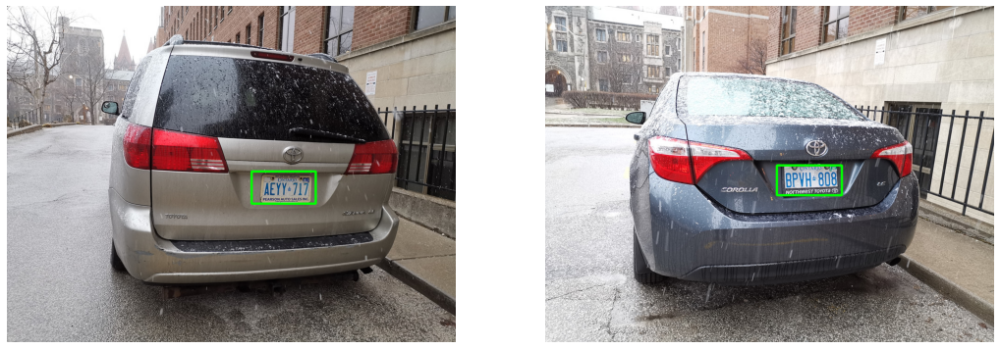

In [ ]:
# get name list of images
image_name_list = ['/content/drive/MyDrive/MIE1517_Project_2022/data_final_test/input/001.jpg',
                   '/content/drive/MyDrive/MIE1517_Project_2022/data_final_test/input/002.jpg']

# get bounding box
X, Y, X_box = getBoundingBox(image_name_list)

# plot demonstration images with predicted bounding box
plt.figure(figsize=(18,8))
for k in range(0, 2):
    plt.subplot(1,2,k+1)
    plt.axis('off')
    plt.imshow(cv2.cvtColor(X_box[k],cv2.COLOR_BGR2RGB))

### 1.3.2 Predict bounding box for each frame

In [ ]:
# save frames of original video
demo_dir = '/content/drive/MyDrive/MIE1517_Project_2022/demonstration'
vidcap = cv2.VideoCapture(demo_dir+'/demo_video_3.mp4')
success,image = vidcap.read()
count = 0
while success:
  cv2.imwrite(demo_dir+'/frame_original_3/frame%d.jpg' % count, image)    
  success,image = vidcap.read()
  count += 1

In [ ]:
# get bounding box of each frame
frame_list = glob.glob(demo_dir+'/frame_original_3/*.jpg')
X, Y, X_box = getBoundingBox(frame_list) # X: original image; # Y: box

In [ ]:
# write video with annotations
height, width, layers = X_box[0].shape
size = (width,height)
out = cv2.VideoWriter(demo_dir+'/demo_video_box_3.mp4',cv2.VideoWriter_fourcc(*'DIVX'), 30, size)
for i in range(len(X_box)):
    out.write(X_box[i])
out.release()

# **Part 2 - Character recognition**

The key to success for text recognition is using the right training data. Reading the whole license plate at once, which is OCR (optical character recognition) has been attempted. It fails when applying the trained model to read license plate, because the image dataset used for training is very different from license plate images. It has been a hard time to find an existing dataset that has whole content license plate labeled, and labeling many license plates is very time consuming. So rather than reading whole plate at once, the method of character cropping and single character classifier is adopted. Finding or building a dataset for single character is relatively much more easier.

When looking for suitable single character dataset, EMNIST has been tried, but this handwritten style character dataset is not working well. Eventually, a standard style character dataset is found. It is giving some very good results, considering that this is a classification among 36 classes (some characters are also very similar).


## 2.1 CNN model for character classification

In this section, we will train a CNN model to classify characters. The dataset is obtained from kaggle: https://www.kaggle.com/datasets/preatcher/standard-ocr-dataset

The dataset contains 23869 images of printed English letters and numbers with 36 classes.

The code below preprocesses the images and save the dataset as numpy arrays.

In [ ]:
# preprocess images and save data
data_dir = '/content/drive/MyDrive/MIE1517_Project_2022/data_character_classification/'
char_list = ['A','B','C','D','E','F','G','H','I','J','K','L','M','N','O','P','Q','R','S','T','U','V','W','X','Y','Z',
             '1','2','3','4','5','6','7','8','9','0']
folders = ['training_data','testing_data']
X = []
y = []
for folder in folders:
  for i in tqdm(range(len(char_list))):
    for fn in glob.glob(data_dir+folder+'/'+char_list[i]+'/*'):
      img = cv2.imread(fn)
      # get gray scale image
      gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
      # binarization
      binary = cv2.threshold(gray, 180, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]
      # resize to 30x30
      img2 = cv2.resize(binary, dsize=(30, 30))
      X.append(img2)
      y.append(i)
X = np.array(X)
y = np.array(y)

# create a dictionary and save the dataset
data = {'X':X, 'y':y, 'char_list':char_list}
with open(data_dir+'data_array', "wb") as fp:   #Pickling
    pickle.dump(data, fp)

Next, the dataset will be preprocessed for training.

In [ ]:
# load data
data_dir = '/content/drive/MyDrive/MIE1517_Project_2022/data_character_classification/'
with open(data_dir+'data_array', "rb") as fp:   # Unpickling
    data = pickle.load(fp)

# preprocess for training

# normalization of images
X_norm = data['X']/255
# one-hot encodeing of labels
y_onehot = np_utils.to_categorical(data['y'])

# split data
X_train, X_test, y_train, y_test = train_test_split(X_norm, y_onehot, test_size = 0.3, random_state = 3)
X_val, X_test, y_val, y_test = train_test_split(X_test, y_test, test_size = 0.5, random_state = 1)

print(X_train.shape, y_train.shape)
print(X_val.shape, y_val.shape)
print(X_test.shape, y_test.shape)

(16708, 30, 30) (16708, 36)
(3580, 30, 30) (3580, 36)
(3581, 30, 30) (3581, 36)


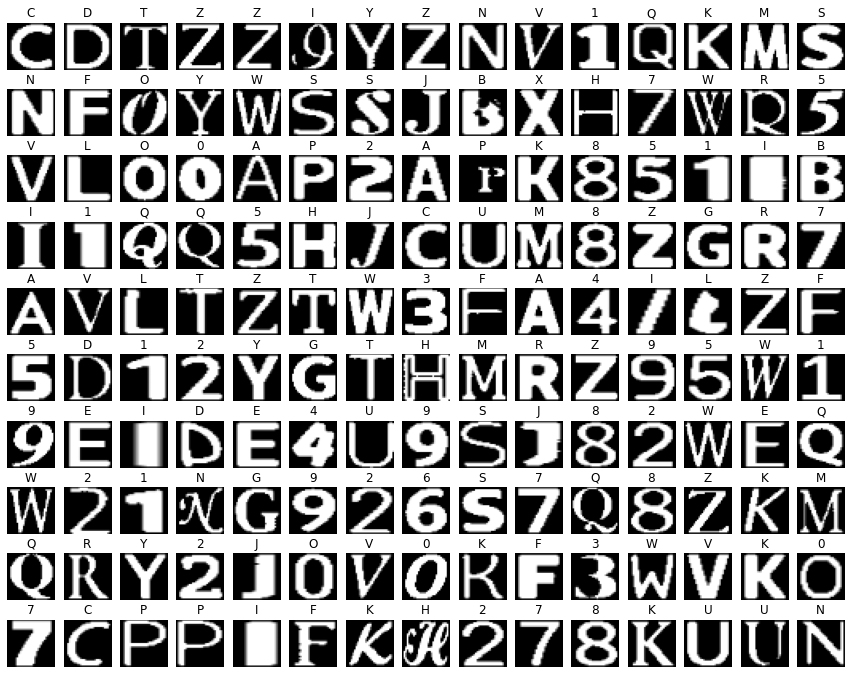

In [ ]:
# plot some training data with labels
plt.figure(figsize=(15,12))
for k in range(150):
  plt.subplot(10,15,k+1)
  plt.axis(False)
  plt.imshow(X_train[k]*255,cmap='gray')
  plt.title(data['char_list'][np.argmax(y_train[k])])

Functions for training are shown below.

In [ ]:
def create_model_p2(learning_rate):
  # create model
  model = Sequential()
  model.add(Conv2D(30, (5, 5), input_shape=(30, 30, 1), activation='relu'))
  model.add(MaxPooling2D(pool_size=(2, 2)))
  model.add(Conv2D(15, (3, 3), activation='relu'))
  model.add(MaxPooling2D(pool_size=(2, 2)))
  model.add(Dropout(0.2))
  model.add(Flatten())
  model.add(Dense(128, activation='relu'))
  model.add(Dense(50, activation='relu'))
  model.add(Dense(36, activation='softmax'))
  # Compile model
  opt = keras.optimizers.Adam(learning_rate=learning_rate)
  model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['accuracy'])
  return model

def train_cnn_p2(epochs, batch_size, learning_rate, checkpoint_filepath):
  model = create_model_p2(learning_rate)
  checkpoint = ModelCheckpoint(checkpoint_filepath, monitor='val_accuracy',verbose=0,
                               save_weights_only=True,save_best_only=True,mode='max')

  # Fit the model
  train = model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=epochs, batch_size=batch_size,
                    callbacks=[checkpoint,TqdmCallback(verbose=0)], verbose=0)
  # Plot accuracy and loss curves
  plt.figure(figsize=(15, 4))
  loss = train.history['loss']
  val_loss = train.history['val_loss']
  acc = train.history['accuracy']
  val_acc = train.history['val_accuracy']
  epochs = range(len(loss))

  plt.subplot(1,2,1)
  plt.plot(epochs, loss, 'b', label='Training')
  plt.plot(epochs, val_loss, 'r', label='Validation')
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()

  plt.subplot(1,2,2)
  plt.plot(epochs, acc, 'b', label='Training')
  plt.plot(epochs, val_acc, 'r', label='Validation')
  plt.xlabel('Epochs')
  plt.ylabel('Accuracy')
  plt.legend()

After tuning batch size and learning rate, the best choice of the two hyperparameters are 64 and 0.0005, respectively. The code below trains the CNN model.

0epoch [00:00, ?epoch/s]

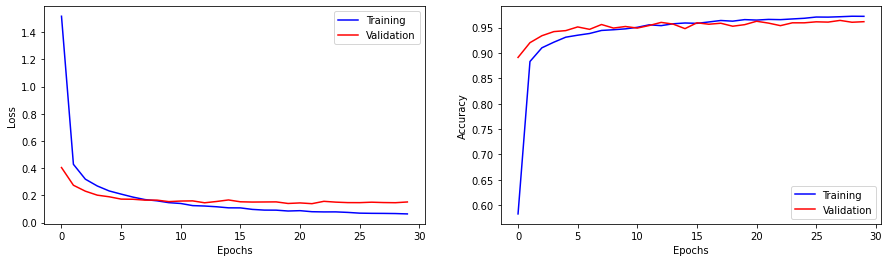

In [ ]:
bs = 64
lr = 0.0005
cf = "/content/drive/MyDrive/MIE1517_Project_2022/temp/best_model_p2_bs{}_lr{}.ckpt".format(bs, lr)
train_cnn_p2(epochs=30, batch_size=bs, learning_rate=lr, checkpoint_filepath=cf)

## 2.2 Plate character segmentation

In [ ]:
# load the best model for character classification
bs = 64
lr = 0.0005
cf = "/content/drive/MyDrive/MIE1517_Project_2022/temp/best_model_p2_bs{}_lr{}.ckpt".format(bs, lr)
best_model_p2 = create_model_p2(lr)
best_model_p2.load_weights(cf)

results = best_model_p2.evaluate(X_test, y_test, verbose=0)
print('test accuracy = {:.3f}'.format(results[1]))

test accuracy = 0.964


In [ ]:
# crop plate image from the original images
plate_image = []
for k in range(0,len(Y)):
  ymin, xmin, ymax, xmax = Y[k]
  plate_image.append(X[k][int(ymin):int(ymax),int(xmin):int(xmax)])

The following functions are used for locate and crop each character in the plate image. The segmentation process is modified based on https://medium.com/@quangnhatnguyenle/detect-and-recognize-vehicles-license-plate-with-machine-learning-and-python-part-2-plate-de644de9849f.

In [ ]:
def preproc_plate_img(img):
    # gray scale image
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # binarized image
    binary = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY_INV, 5, 10)
    return binary

# Create sort_contours() function to grab the contour of each character from left to right
def sort_contours(cnts,reverse = False):
    i = 0
    boundingBoxes = [cv2.boundingRect(c) for c in cnts]
    (cnts, boundingBoxes) = zip(*sorted(zip(cnts, boundingBoxes), key=lambda b: b[1][i], reverse=reverse))
    return cnts

def del_overlap_roi(roi):
  # if multiple regions of interest (roi) have been identified on one character, 
  # leave the one with the smallest area and delete the rest
  roi_del_ind = []
  for i in range(len(roi)-1):
      xmin1 = roi[i][0]
      ymin1 = roi[i][1]
      xmax1 = xmin1+roi[i][2]
      ymax1 = ymin1+roi[i][3]
      A1 = roi[i][2]*roi[i][3]

      xmin2 = roi[i+1][0]
      ymin2 = roi[i+1][1]
      xmax2 = xmin2+roi[i+1][2]
      ymax2 = ymin2+roi[i+1][3]
      A2 = roi[i+1][2]*roi[i+1][3]

      C = (max(xmax1,xmax2)-min(xmin1,xmin2))*(max(ymax1,ymax2)-min(ymin1,ymin2))

      if (A1/C>0.9) | (A2/C>0.9):
        if A1>A2:
          roi_del_ind.append(i+1)
        else:
          roi_del_ind.append(i)
  roi = np.array(roi)
  roi2 = np.delete(roi, roi_del_ind, 0)
  return(roi2)


def get_crop_characters(img):
    # implement character segmentation
    binary = preproc_plate_img(img)
    cont, _  = cv2.findContours(binary, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)

    # creat a copy version "test_roi" of plat_image to draw bounding box
    img_roi = img.copy()

    # Initialize a list which will be used to append charater image
    crop_characters = []

    # define standard width and height of character
    digit_w, digit_h = 30, 30

    (H,W) = img.shape[0:2]
    roi = []
    for c in sort_contours(cont):
        (x, y, w, h) = cv2.boundingRect(c)
        ratio = h/w
        if 1.5<=ratio<=3: # Only select contour with defined ratio
            if 0.3<h/img.shape[0]<0.6: # Select contour which has the height larger than 30% of the plate
                roi.append([x, y, w, h])
    roi2 = del_overlap_roi(roi)

    for i in range(roi2.shape[0]):
        (x, y, w, h) = roi2[i,:]
        # Draw bounding box arroung digit number
        cv2.rectangle(img_roi, (x, y), (x + w, y + h), (0, 255,0), thickness=1)
        # Sperate number and gibe prediction
        curr_num = binary[max((y-int(h*0.05)),0):min((y+int(h*1.05)),H),max((x-int(w*0.1)),0):min((x+int(w*1.1)),W)]
        curr_num = cv2.resize(curr_num, dsize=(digit_w, digit_h))
        # _, curr_num = cv2.threshold(curr_num, 220, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
        crop_characters.append(curr_num)
    crop_characters = np.array(crop_characters)
    return img_roi, crop_characters, roi2


A plot of a plate image from the demonstration video frames with bounding boxes of characters is show below. The preprocessed images of each character are also presented.

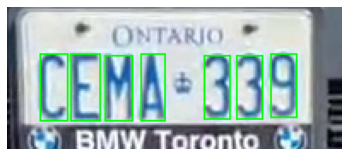

In [ ]:
i = 500
test_plt_img = plate_image[i]
img_roi, crop_characters, roi = get_crop_characters(test_plt_img)
plt.imshow(cv2.cvtColor(img_roi,cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

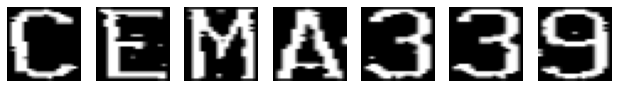

In [ ]:
plt.figure(figsize=(14,4))
for i in range(len(crop_characters)):
    plt.subplot(1,9,i+1)
    plt.axis(False)
    plt.imshow(crop_characters[i],cmap="gray")

## 2.3 Plate character recognition

The function below integrate the following steps to generate the final output image:


*   Take the original image, image with box, and box location as inputs
*   Get the corpped image of each character
*   Classify the character
*   Put predicted characters above the box in the image



In [ ]:
char_list = ['A','B','C','D','E','F','G','H','I','J','K','L','M','N','O','P','Q','R','S','T','U','V','W','X','Y','Z',
             '1','2','3','4','5','6','7','8','9','0']

def gen_image_with_characters(img_original,img_with_box,box):
    ymin, xmin, ymax, xmax = box
    plate_image = img_original[int(ymin):int(ymax),int(xmin):int(xmax)]

    img_roi, crop_characters, roi = get_crop_characters(plate_image)
    img_recog = img_with_box.copy()
    if len(roi) != 0:
        y_test_pr = best_model_p2.predict(crop_characters/255)
        y_test_pr_ind = np.argmax(y_test_pr,axis=1)
        char_recog = ''.join([char_list[i] for i in y_test_pr_ind])

        # character plotting option 1
        # for ch in range(len(char_recog)):
        #     (x,y,w,h) = roi[ch]
        #     org = (x+int(xmin),int(ymin-(ymax-ymin)*0.1))
        #     cv2.putText(img_recog, char_recog[ch], org, cv2.FONT_HERSHEY_SIMPLEX, fontScale=1, color=(0, 255, 0),thickness=2)

        # character plotting option 2
        org = (int(xmin),int(ymin-(ymax-ymin)*0.2))
        cv2.putText(img_recog, char_recog, org, cv2.FONT_HERSHEY_SIMPLEX, fontScale=2, color=(0, 255, 0),thickness=6)
    return img_recog

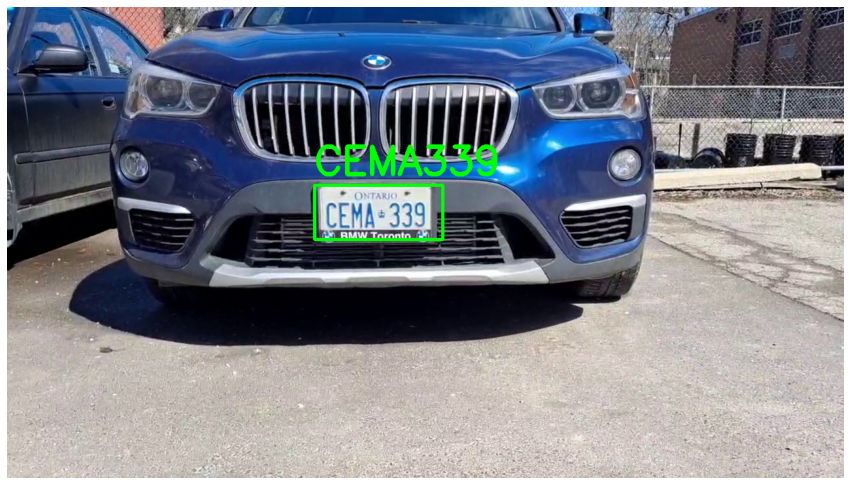

In [ ]:
# show one example of the final output image
k = 500
img_recog = gen_image_with_characters(X[k],X_box[k],Y[k])

plt.figure(figsize=(15,10))
plt.axis(False)
plt.imshow(cv2.cvtColor(img_recog,cv2.COLOR_BGR2RGB))
plt.show()

## 2.4 Final test on new data

Before testing on new data, we will build a final function that takes the file path of images, and outputs the images with annotations.

In [ ]:
def getFinalOutputImage(image_name_list):
  op_img = [] # output image
  # generate outputs
  for full_path in image_name_list:
    # read image
    image = cv2.imread(full_path)
    (h, w) = image.shape[:2]

    # resize and normalization
    resize_image = cv2.resize(image, (224, 224))
    resize_image = np.expand_dims(resize_image, axis=0)/255

    # prediction
    y_norm = best_model.predict(resize_image)
    y = np.multiply(y_norm, [h,w,h,w])

    ymin, xmin, ymax, xmax = y[0]
    image_box = image.copy()
    cv2.rectangle(image_box, (int(xmin), int(ymin)), (int(xmax), int(ymax)), color=(0, 255, 0), thickness=3)
    
    img_recog = gen_image_with_characters(np.array(image),image_box,y.squeeze())

    op_img.append(img_recog)

  return op_img

Test on 42 new data and show 5 output examples.

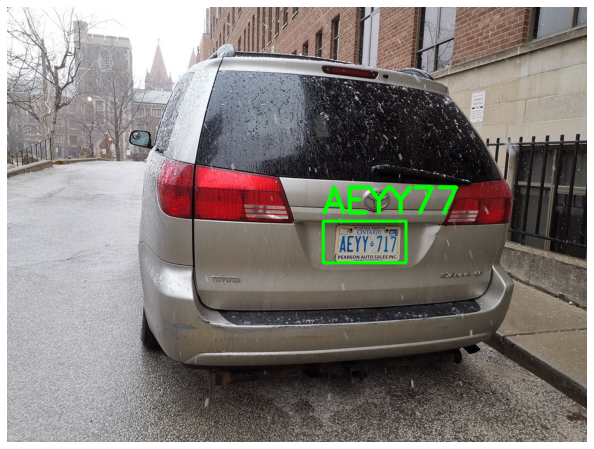

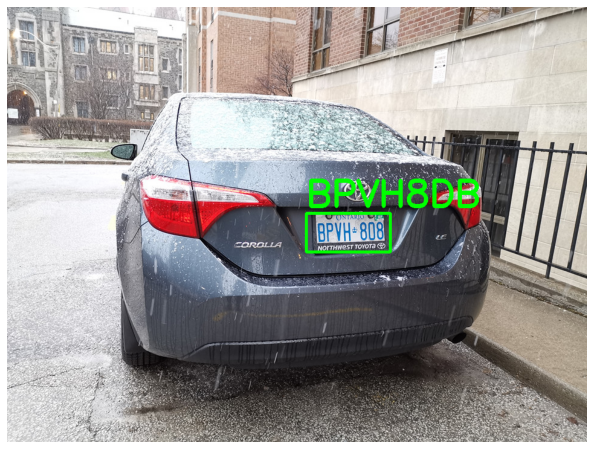

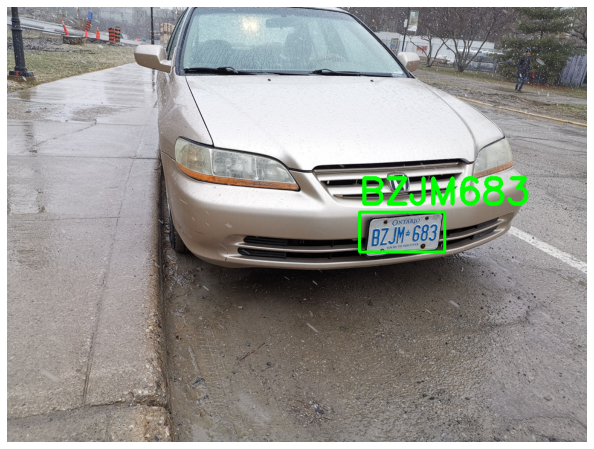

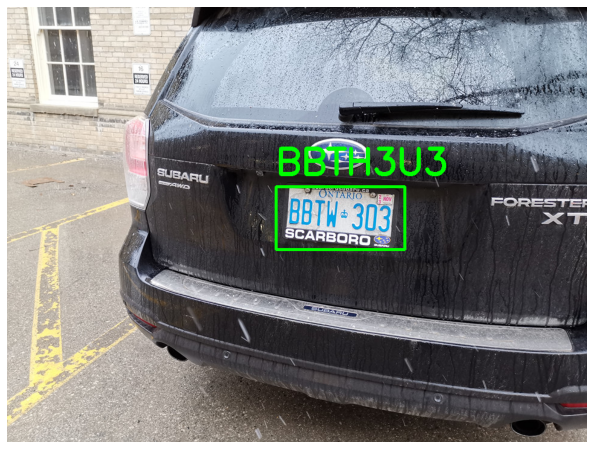

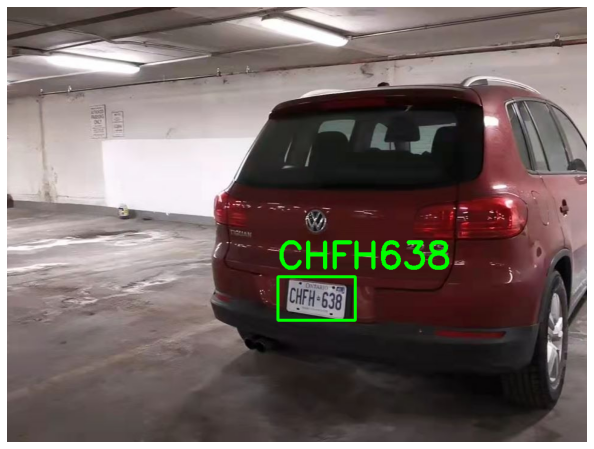

In [ ]:
fianl_test_dir = '/content/drive/MyDrive/MIE1517_Project_2022/data_final_test'
final_list = sorted(glob.glob(fianl_test_dir+'/input/*.jpg'))

# get output images
op_img = getFinalOutputImage(final_list)

# save output images
for k in range(len(op_img)):
    cv2.imwrite(fianl_test_dir+'/output/'+str(k+1)+'.jpg', op_img[k])  

# plot 5 output images
for k in range(5): 
    plt.figure(figsize=(18,8))
    plt.axis('off')
    plt.imshow(cv2.cvtColor(op_img[k],cv2.COLOR_BGR2RGB))

A summary of the final test is shown below:

| Test images | Correctly detected bounding boxes | Total characters | Correctly recognized characters |
| --- | --- | --- |  --- |
| 42 | 37 | 291 | 223 |



| Plate detection accuracy | Character recognition accuracy |
| --- | --- |
| 88.1% | 76.6% |

## 2.5 Demonstration video

Next, we generate the final ouput images of all the frames in the demonstration video, and write a new video using the outputs.


In [ ]:
frame_list = glob.glob(demo_dir+'/frame_original_3/*.jpg')
op_img_demo = getFinalOutputImage(frame_list)

100%|██████████| 860/860 [01:50<00:00,  7.78it/s]


In [ ]:
# write video with annotations
height, width, layers = op_img_demo[0].shape
size = (width,height)
out = cv2.VideoWriter(demo_dir+'/demo_video_box_char_3.mp4',cv2.VideoWriter_fourcc(*'DIVX'), 30, size)
for i in tqdm(range(len(op_img_demo))):
    out.write(op_img_demo[i])
out.release()

100%|██████████| 860/860 [00:07<00:00, 107.73it/s]


## 2.6 Problematic Scenarios for Character Recognition

Our character classifier is still making mistakes at the end. However, this is reasonable, because some letters and digits are very similar. Here are some common mistakes that the classifier makes:
1. Misclassify many (not all) 0s as D or U.

2. Cannot capture 1 because it is too thin to be detected. The current filter based on character height-to-width ratio successfully ignores irrelavant contents on license plate when cropping, but also misses out 1. It needs to be adjusted by tuning the target height-to-width ratio interval or by adding more filtering conditions.


# Part 3 General Discussion


The biggest lesson is that the key to success of building a functional deep neural network is using a correct training dataset. Due to its model complexity, deep neural network requires large number of training samples. If the training dataset found is not matching the actual samples the model is going to work on, then there would not be a reasonable result.

The performance of the current model (part 1 and 2) is very good. However, there are some limitations. For part 1, the model can only handle image with one license plate. And because the training set is not big enough, so the bounding box is not always accurate. For part 2, the background color of the license plate must be white for the model to work. Model performance poor in scenarios mentioned in section 2.6, and when the license plate is far or too close. Nevertheless, the current model can read the license plate well under these limitation. It is a good starting point for developing more robust model with less limitations.



# **Part 4 - Future improvements**



Althought some reasonable results have be produced in both parts, there are still many approaches to improve the performance of the framework.

We are considering the following ways to improve the applicability and accuracy of vehicle plate detection:

1.   Use more advanced models such as Faster R-CNN and YOLOv5. These models will not only improve the accuracy of plate localization but also be able to detect multiple plates in an image.

2.   Obtain more images with different conditions (e.g., light and angle). The dataset can also include other types of vehicles such as trucks and motocycles.

and the following ways to improve the accuracy and robustness of text recogniation:



1.   Instead of using existing general text character data, build our own dataset of license plate character by cropping characters from large number of license plates and labeling them.

2.   Expand size of training dataset by generating samples of character with slightly different size, like SIFT (scale-invariant feature transformation).

3.   Currently, our preprocessing only have adjustment for rotational effect. If the 4 vertices of license plate can be found that we can find then matrix for projective transformation accounting for effect of angle of view.

4. As mentioned in section 2.6, the irrelevant content filter used when cropping needs to be improved.


In [ ]:
%%shell
jupyter nbconvert --to html Final_report_plate_detection_model.ipynb